First step is to inport to csv with all of the data and do some anylisis on it.

-search for any null values
-make some graphs and charts to visiulize data


In [2]:
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data = pd.read_csv("Extended_Employee_Performance_and_Productivity_Data.csv")

#convert education level to numarical values from 0-3
data['Education_Level'] = data['Education_Level'].replace('High School', '0')
data['Education_Level'] = data['Education_Level'].replace('Bachelor', '1')
data['Education_Level'] = data['Education_Level'].replace('Master', '2')
data['Education_Level'] = data['Education_Level'].replace('Phd', '3')

data['Education_Level'] = pd.to_numeric(data['Education_Level'], errors='coerce')
data['Education_Level'] = data['Education_Level'].fillna(0).astype('int64')

# Display the first few rows of the dataset as a nicely formatted table
print("First five rows of the dataset:")
print(tabulate(data.head(), headers='keys', tablefmt='pretty'))

# Check for null values
print("\nNull values in each column:")
print(data.isnull().sum())

# Get data types of each column
print("\nData types of each column:")
print(data.dtypes)

# Basic statistical summary
print("\nStatistical summary of numerical columns:")
print(data.describe())

# Information on the dataset
print("\nGeneral info about the dataset:")
print(data.info())





First five rows of the dataset:
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+----------+
|   | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score | Resigned |
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------

In [ ]:
# I want ot see all the employess that resigned just to see if they have anything in common

# Filter for employees who resigned
resigned_employees = data[data['Resigned'] == True]

# Display the names of all employees who resigned
# Replace 'Employee_Name' with the actual column name for employee names in your dataset
print("List of employees who resigned:")
print(tabulate(resigned_employees[['Employee_ID',  'Department', 'Gender', 'Age',  'Job_Title',  'Hire_Date',  'Years_At_Company',  'Education_Level',  'Performance_Score', 'Monthly_Salary',  'Work_Hours_Per_Week', 'Projects_Handled',  'Overtime_Hours',  'Sick_Days', 'Remote_Work_Frequency', 'Team_Size',  'Training_Hours',  'Promotions',  'Employee_Satisfaction_Score']], headers='keys', tablefmt='pretty'))

List of employees who resigned:
+-------+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+
|       | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score |
+-------+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+---------

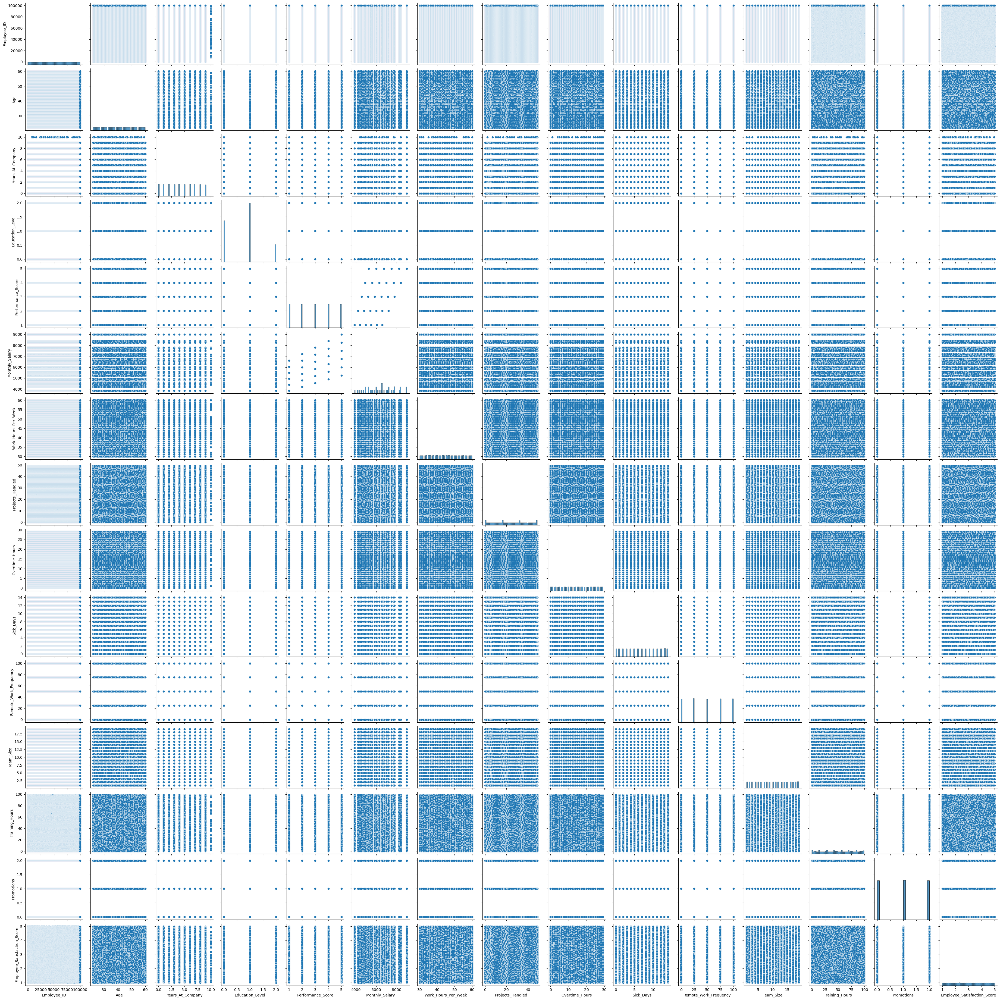

In [2]:
#Visualize the distribution of numerical columns.
# Select numerical columns only
numerical_cols = data.select_dtypes(include=['float64', 'int64'])

# Create pairplot for the numerical columns
sns.pairplot(numerical_cols)

# Show the plot
plt.show()

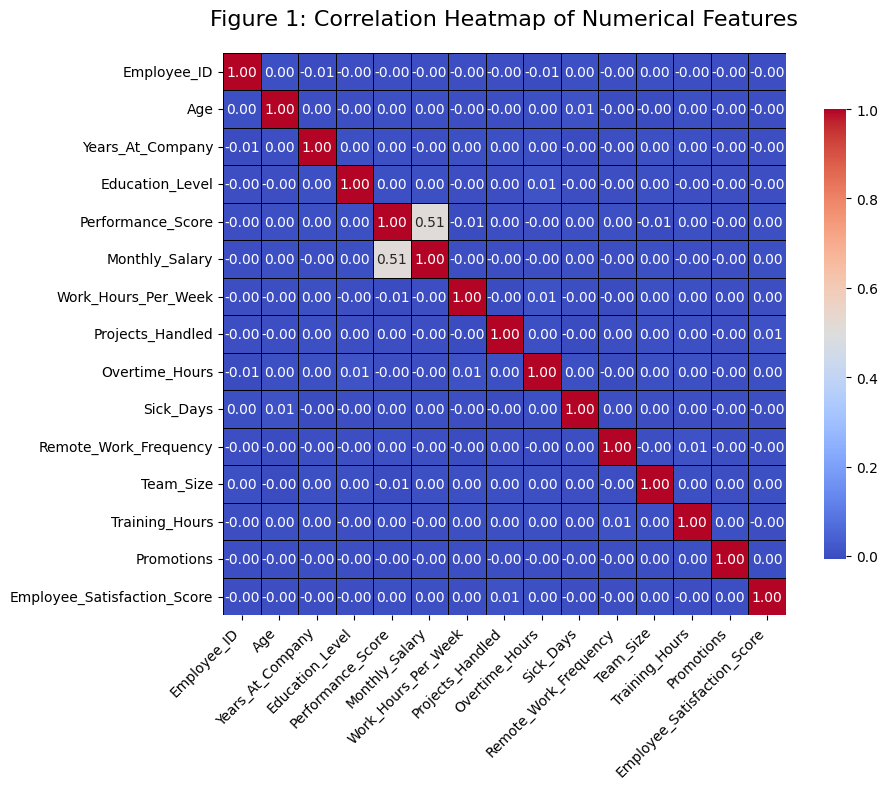

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
# data = pd.read_csv('your_dataset.csv')  # Uncomment and load your dataset here

# Select numerical features
numerical_features = data.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numerical_features.corr()

# Plot a heatmap to visualize the correlation
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,  # Show correlation values
    cmap='coolwarm',  # Use 'coolwarm' color scheme
    fmt='.2f',  # Format the correlation values
    square=True,  # Make each cell square
    cbar_kws={"shrink": 0.8},  # Shrink colorbar size
    linewidths=0.5,  # Add gridlines
    linecolor='black'  # Gridline color
)
plt.title('Figure 1: Correlation Heatmap of Numerical Features', fontsize=16, pad=20)  # Title styling
plt.xticks(fontsize=10, rotation=45, ha='right')  # Rotate x-axis labels
plt.yticks(fontsize=10, rotation=0)  # Rotate y-axis labels
plt.tight_layout()  # Adjust layout for better fitting
plt.show()


# Feature Extraction for Individual Departments

In [7]:
#create a list of all the departments in dataset
df = data['Department']
dept = []

for i in df:
    if i not in dept:
        dept.append(i)
print("list of all departments:")
print(dept)

list of all departments:
['IT', 'Finance', 'Customer Support', 'Engineering', 'Marketing', 'HR', 'Operations', 'Sales', 'Legal']


In [15]:
#create dataframes of each departments

dfIt = data[data['Department'] == 'IT']
dfFin = data[data['Department'] == 'Finance']
dfSup = data[data['Department'] == 'Customer Support']
dfEng = data[data['Department'] == 'Engineering']
dfMark = data[data['Department'] == 'Marketing']
dfOper = data[data['Department'] == 'Operations']
dfSales = data[data['Department'] == 'Sales']
dfLegal = data[data['Department'] == 'Legal']
dfHr = data[data['Department'] == 'HR']


# Create Correlation Heatmaps for each department 

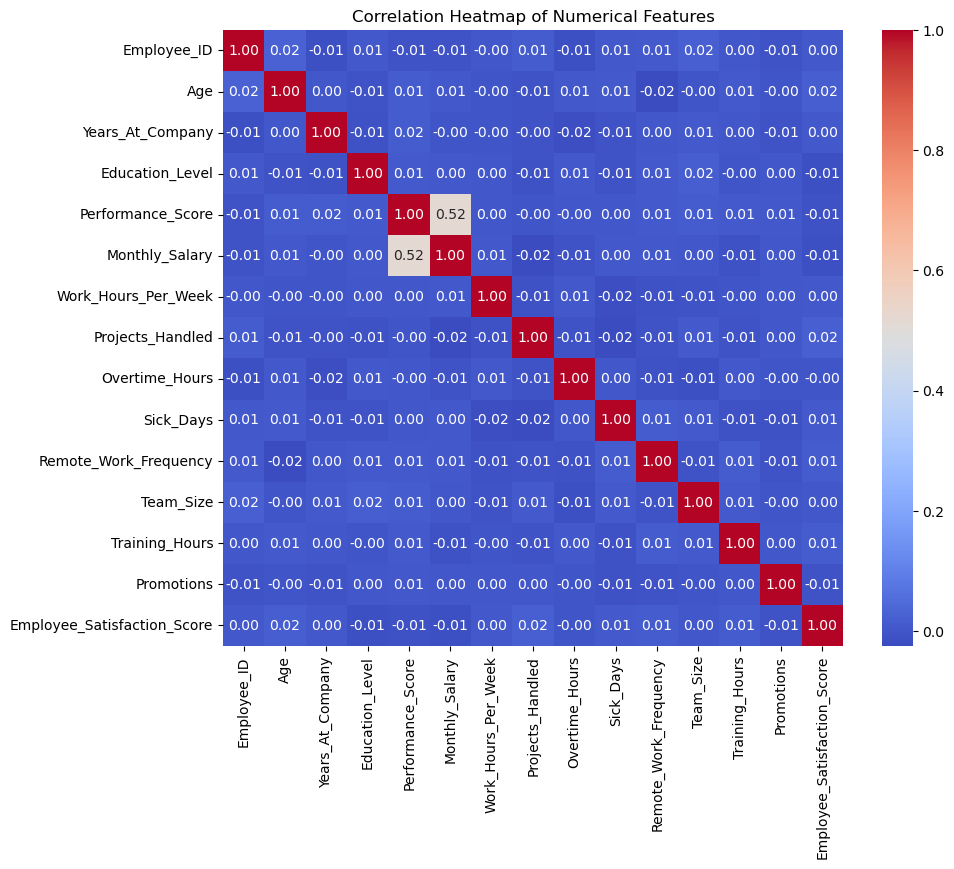

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [10]:
#create a correlation heatmap for IT
# Select only the numerical features from the dataset
numerical_features = dfIt.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

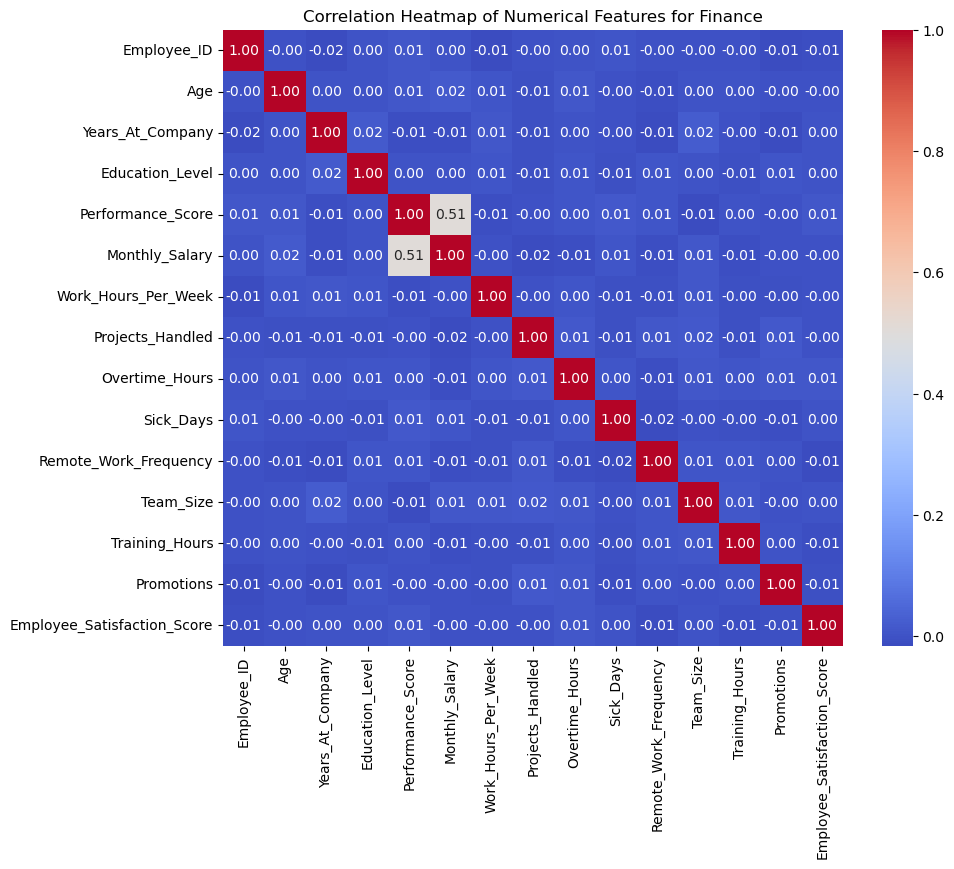

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [15]:
#create a correlation heatmap for Finance
# Select only the numerical features from the dataset
numerical_features = dfFin.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Finance')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

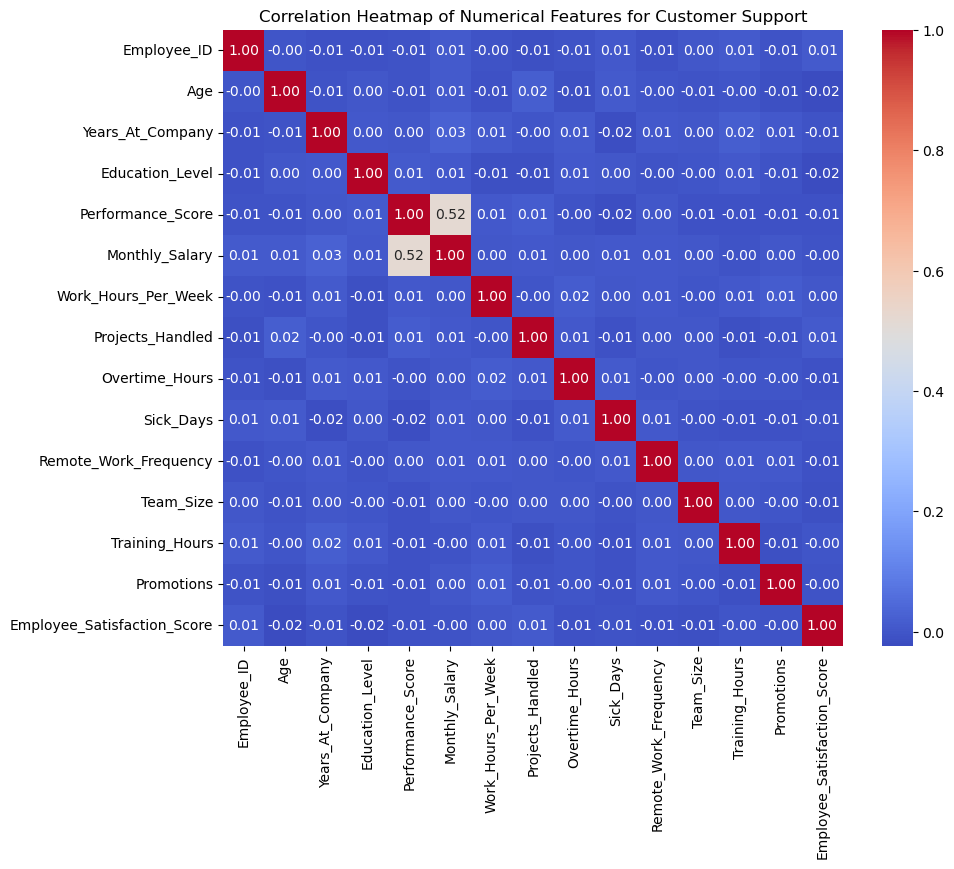

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [16]:
#create a correlation heatmap for Customer Support
# Select only the numerical features from the dataset
numerical_features = dfSup.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Customer Support')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

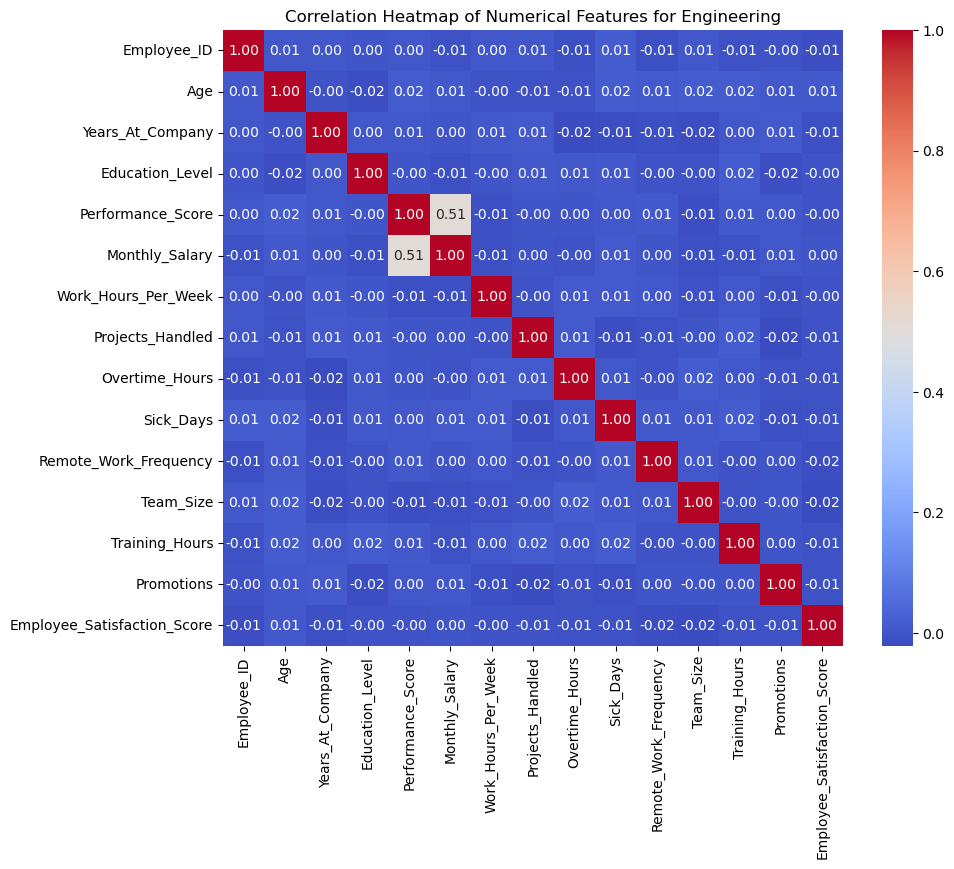

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [17]:
#create a correlation heatmap for Engineering
# Select only the numerical features from the dataset
numerical_features = dfEng.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Engineering')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

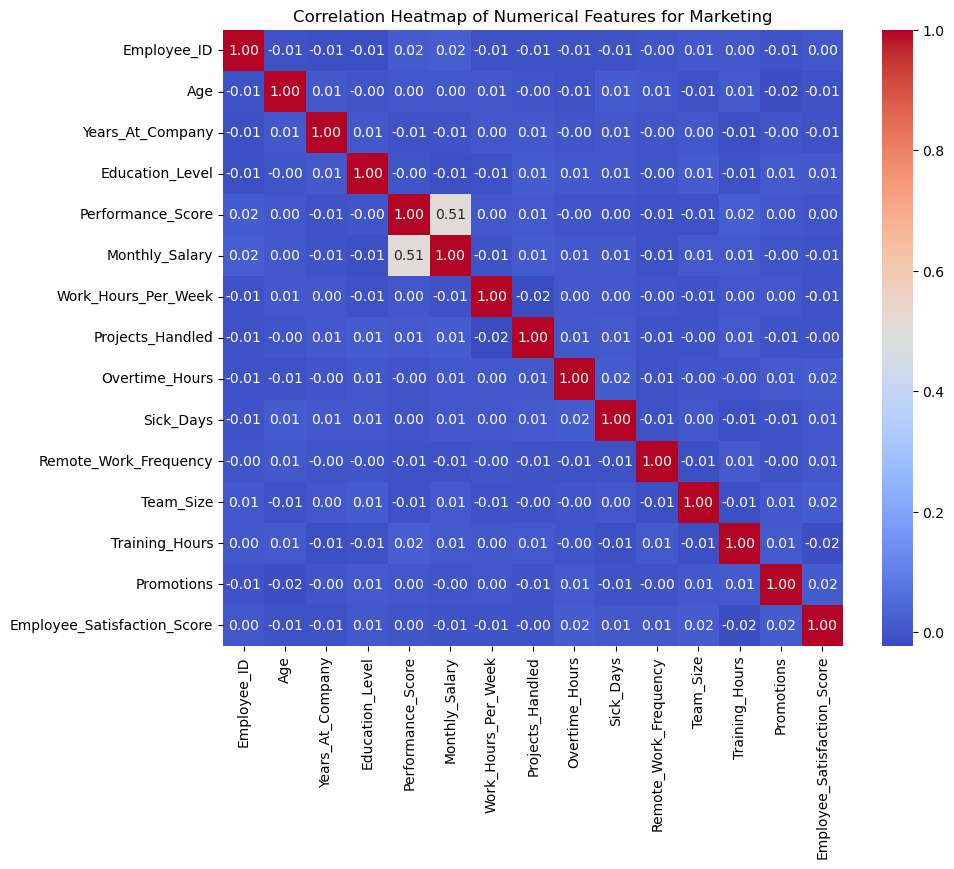

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [18]:
#create a correlation heatmap for Marketing
# Select only the numerical features from the dataset
numerical_features = dfMark.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Marketing')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

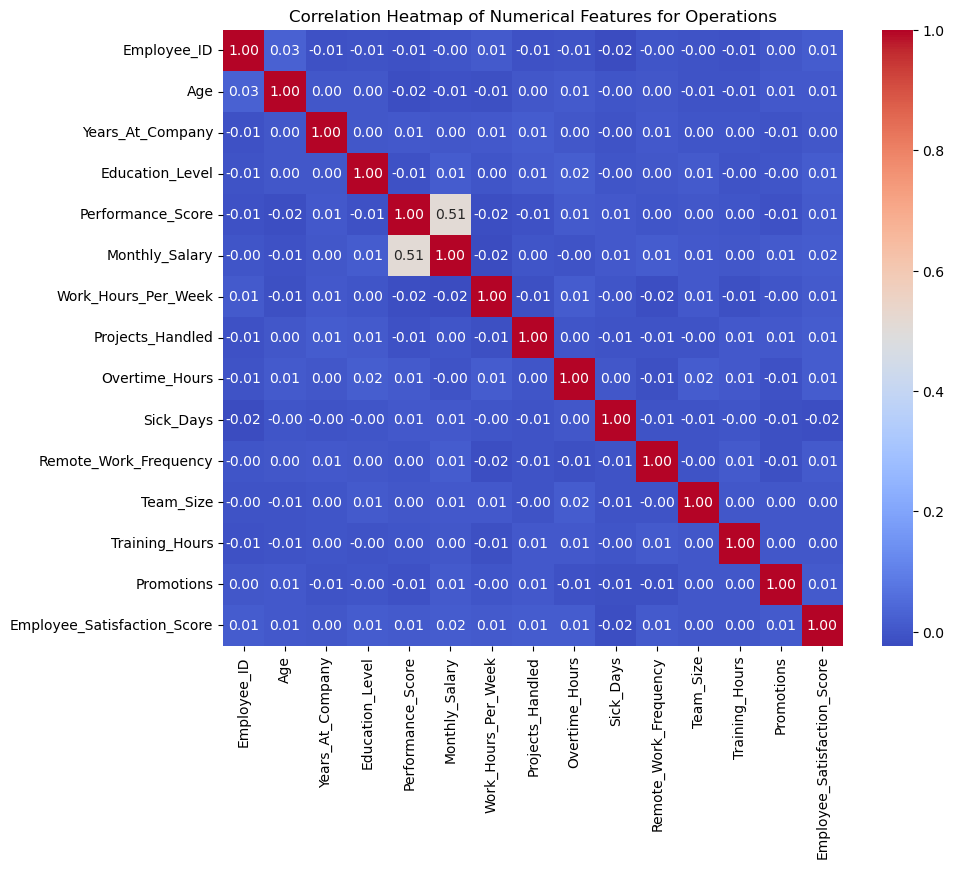

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [19]:
#create a correlation heatmap for Operations
# Select only the numerical features from the dataset
numerical_features = dfOper.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Operations')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

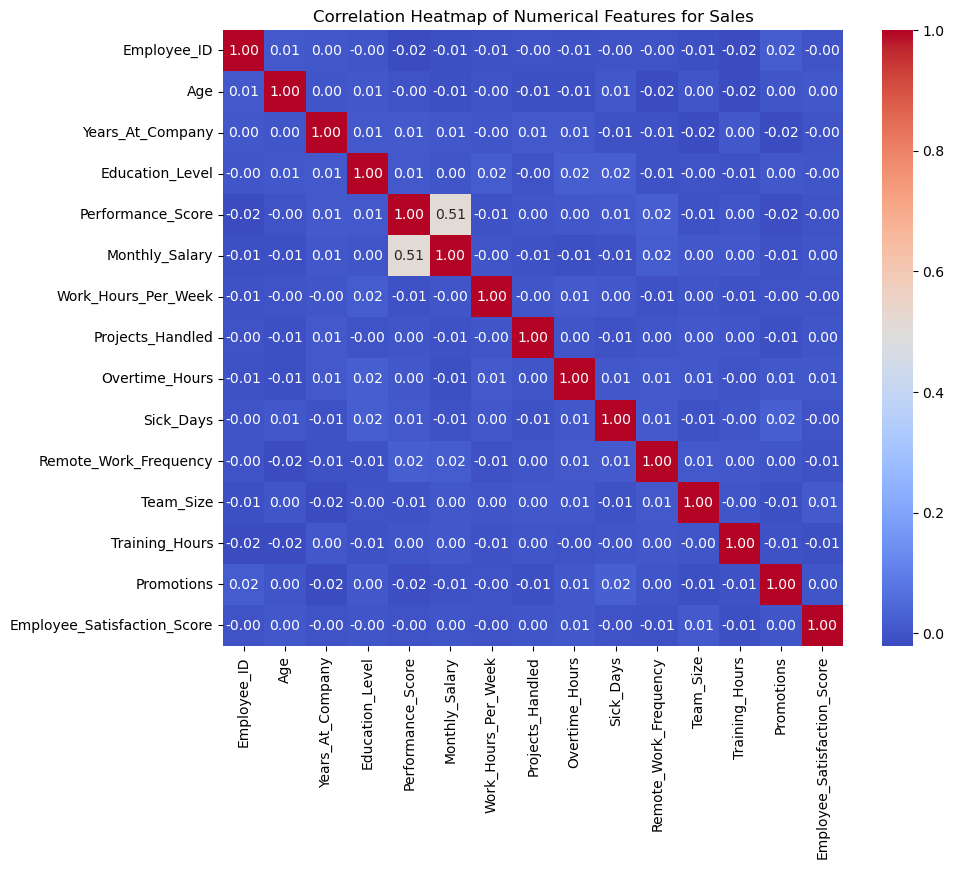

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [20]:
#create a correlation heatmap for Sales
# Select only the numerical features from the dataset
numerical_features = dfSales.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Sales')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

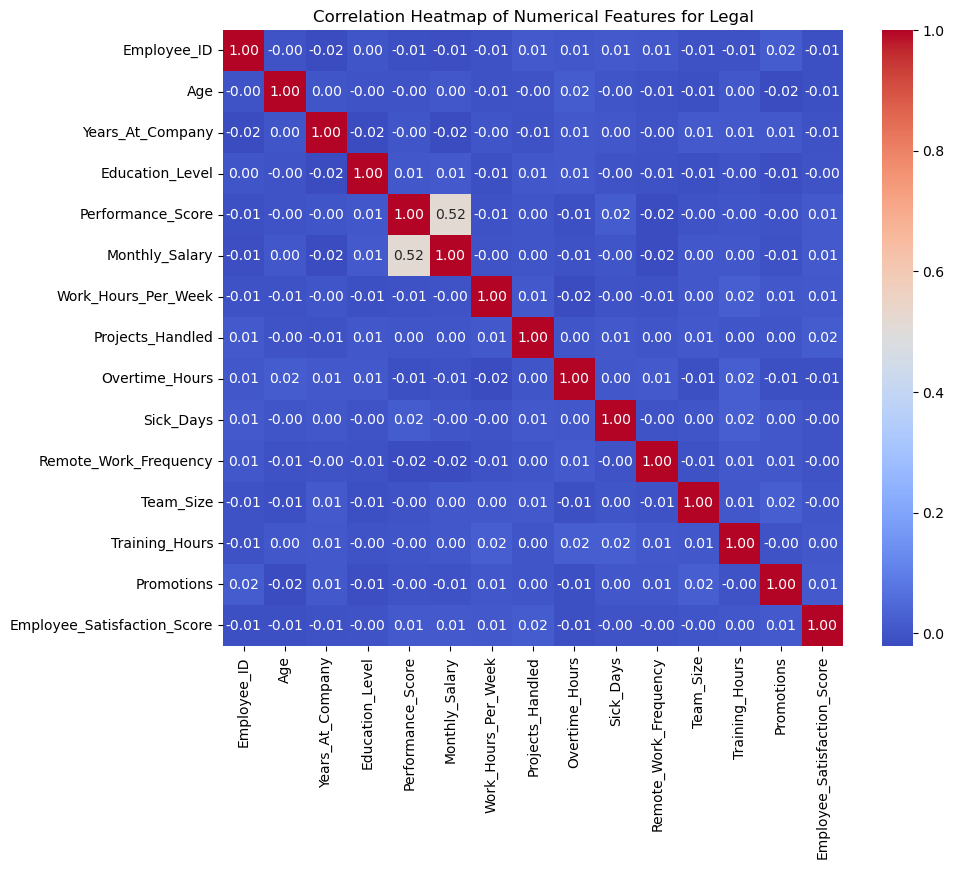

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [21]:
#create a correlation heatmap for Legal
# Select only the numerical features from the dataset
numerical_features = dfLegal.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Legal')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

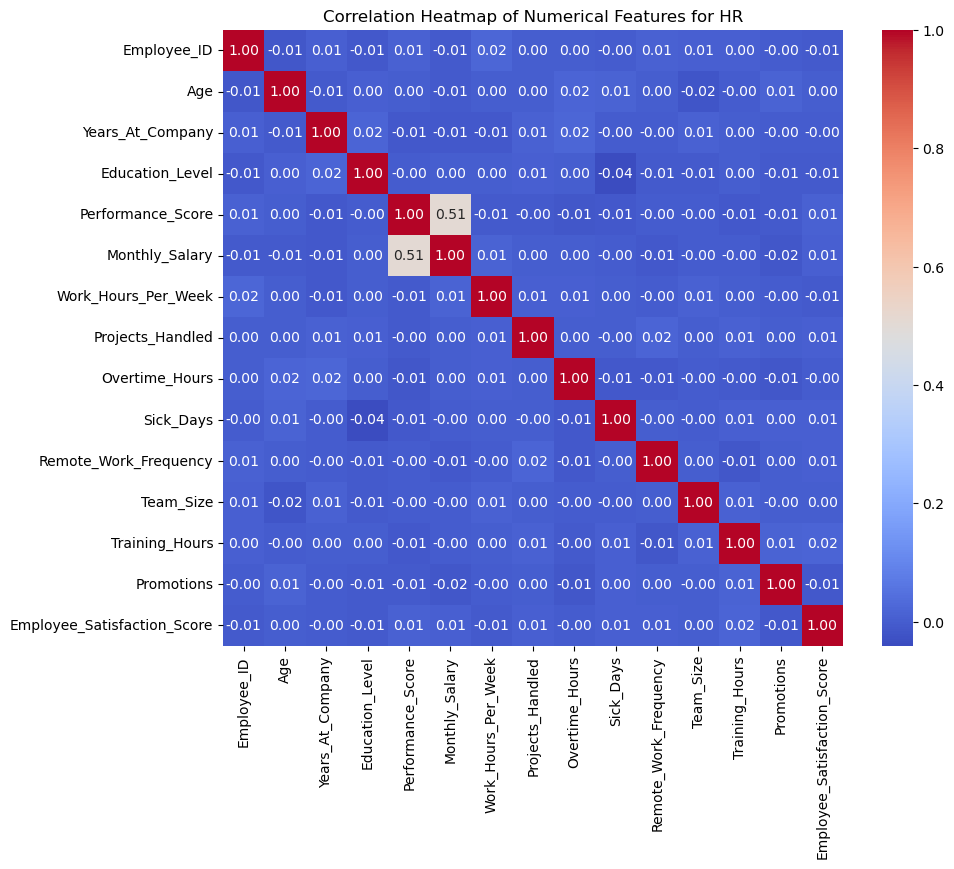

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [22]:
#create a correlation heatmap for HR
# Select only the numerical features from the dataset
numerical_features = dfHr.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for HR')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

Model Accuracy: 1.0

Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00     10068
           2       1.00      1.00      1.00     10016
           3       1.00      1.00      1.00     10030
           4       1.00      1.00      1.00      9934
           5       1.00      1.00      1.00      9952

    accuracy                           1.00     50000
   macro avg       1.00      1.00      1.00     50000
weighted avg       1.00      1.00      1.00     50000


Confusion Matrix:
 [[10068     0     0     0     0]
 [    0 10016     0     0     0]
 [    0     0 10030     0     0]
 [    0     0     0  9934     0]
 [    0     0     0     0  9952]]


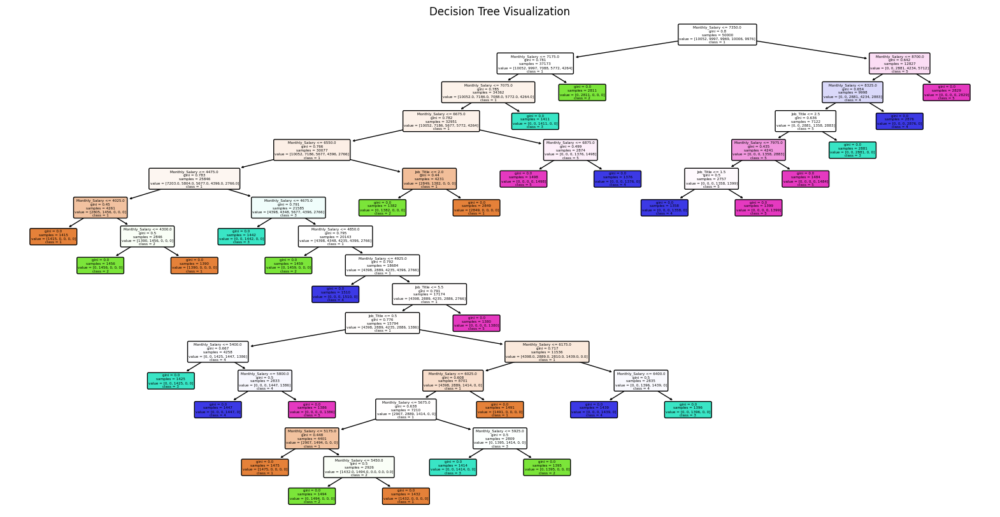

In [11]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# Load your dataset
# Replace 'your_dataset.csv' with the actual path to your dataset
# data = pd.read_csv('your_dataset.csv')  # Uncomment and load your dataset here

# Define the target and feature set
target = 'Performance_Score'  # Replace with your actual target column
X = data.drop(columns=[target])  # Features
y = data[target]  # Target variable


# Encode categorical features
for col in X.select_dtypes(include=['object']).columns:
    encoder = LabelEncoder()
    X[col] = encoder.fit_transform(X[col])

# Encode the target variable if it's categorical
if y.dtype == 'object':
    y = LabelEncoder().fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Train a Decision Tree Classifier
tree_model = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=2)

tree_model.fit(X_train, y_train)

# Make predictions
y_pred = tree_model.predict(X_test)

# Evaluate the model
print("Model Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Visualize the decision tree
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model, 
    feature_names=X.columns, 
    class_names=[str(cls) for cls in np.unique(y)], 
    filled=True, 
    rounded=True
)
plt.title("Decision Tree Visualization")
plt.show()



Building regression tree for department: IT

Department: IT
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

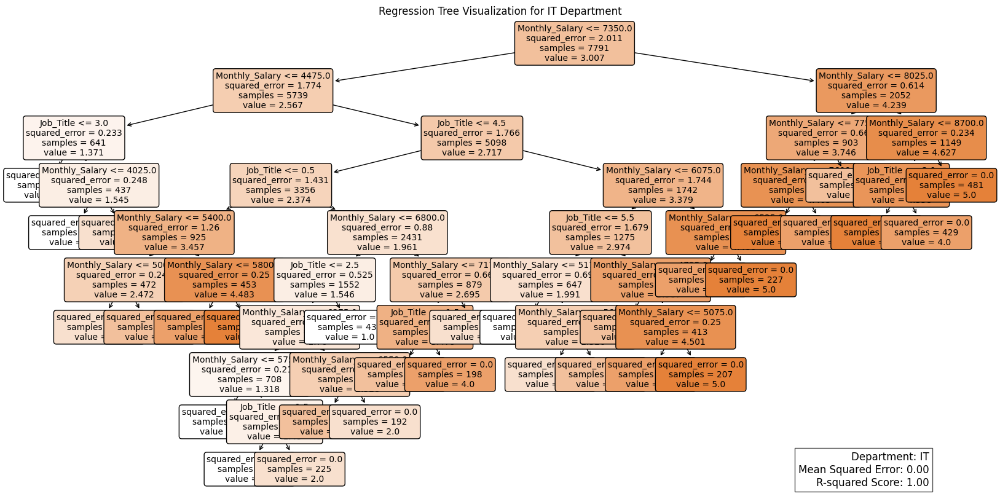


Building regression tree for department: Finance

Department: Finance
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

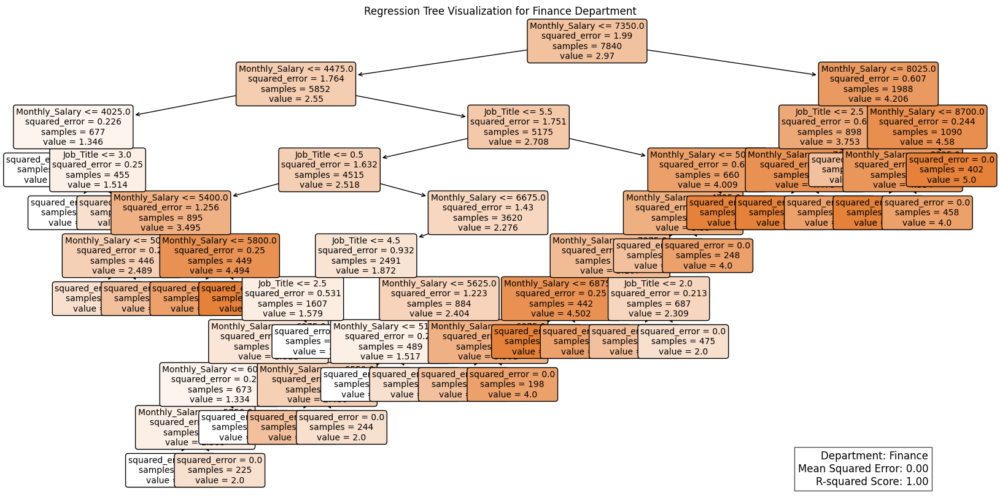


Building regression tree for department: Customer Support

Department: Customer Support
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

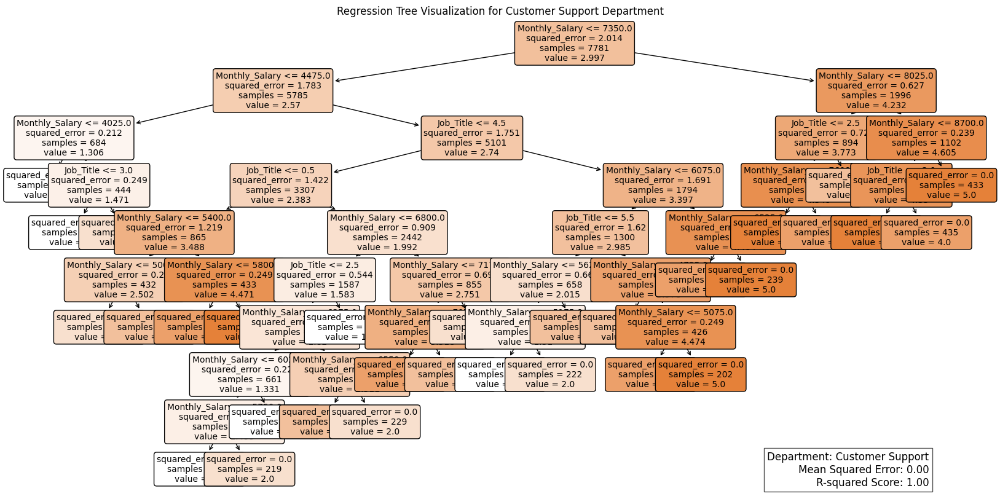


Building regression tree for department: Engineering

Department: Engineering
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

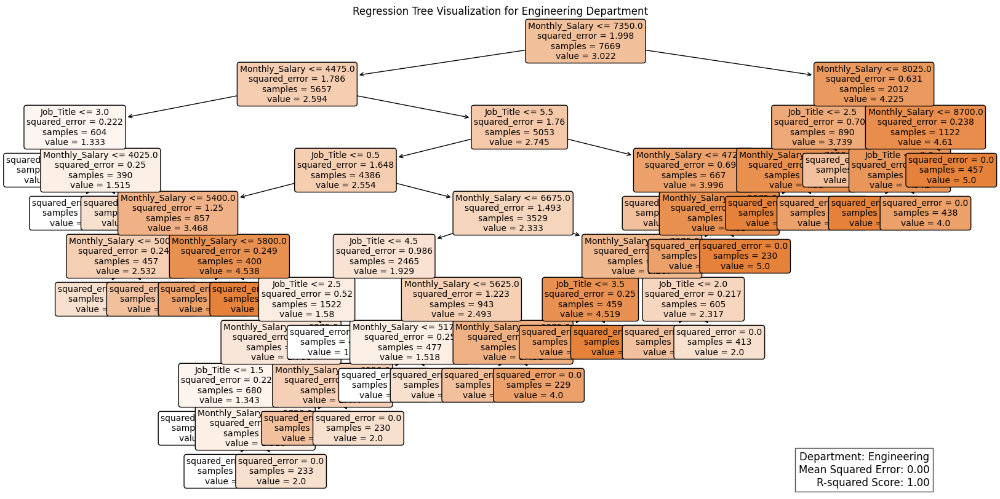


Building regression tree for department: Marketing

Department: Marketing
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

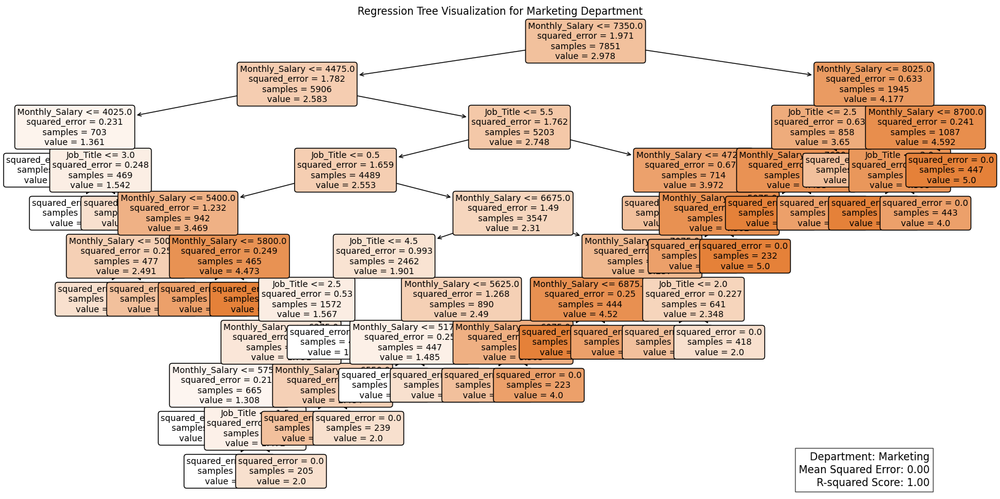


Building regression tree for department: Operations

Department: Operations
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

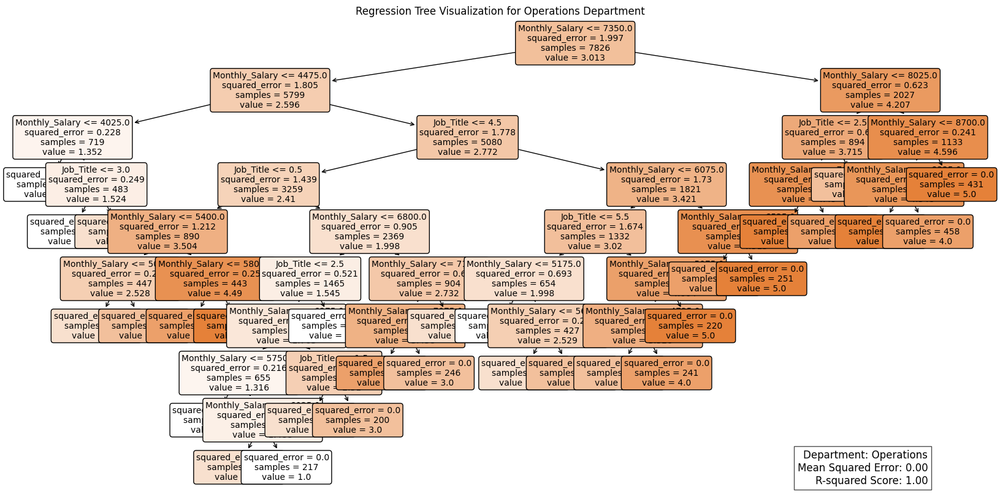


Building regression tree for department: Sales

Department: Sales
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

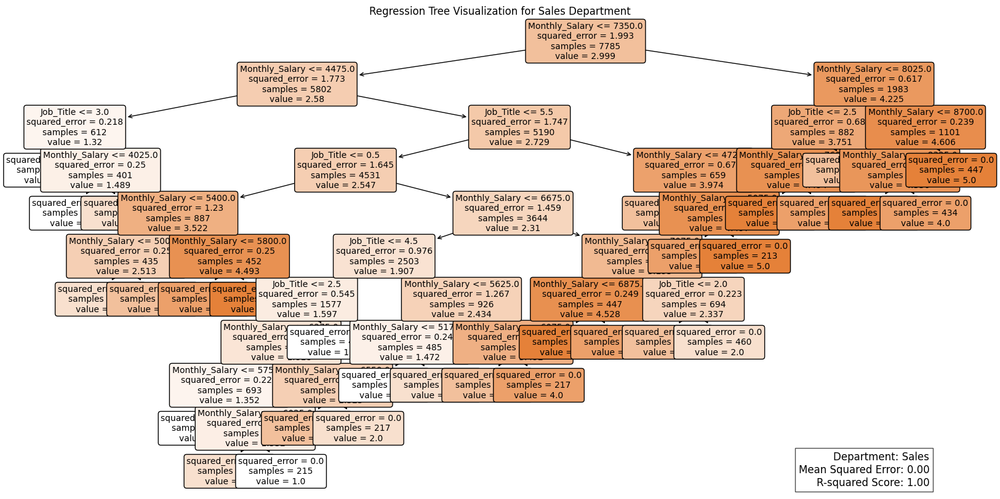


Building regression tree for department: Legal

Department: Legal
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

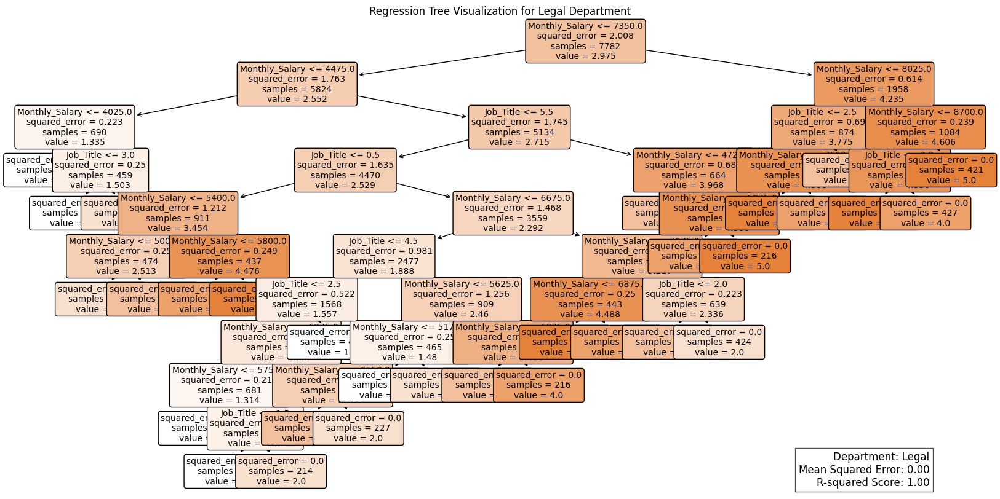


Building regression tree for department: HR

Department: HR
Mean Squared Error: 0.0
R-squared Score: 1.0



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\3460973575.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

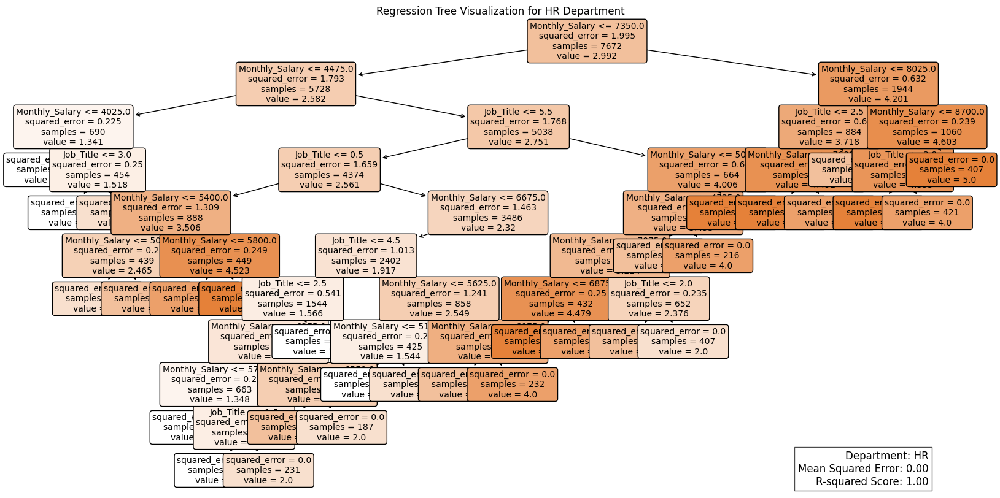

In [17]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding regression tree for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Regression Tree Model
    tree_regressor = DecisionTreeRegressor(criterion='squared_error', random_state=42, max_depth=None)
    tree_regressor.fit(X_train, y_train)

    # Make predictions
    y_pred = tree_regressor.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared Score: {r2}\n")

    # Visualize the Regression Tree with Metrics
    plt.figure(figsize=(20, 10))
    plot_tree(
        tree_regressor,
        feature_names=X.columns,
        filled=True,
        rounded=True,
        fontsize=10
    )
    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nMean Squared Error: {mse:.2f}\nR-squared Score: {r2:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )
    plt.title(f"Regression Tree Visualization for {department} Department")
    plt.show()



Building logistic regression model for department: IT



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: IT
Accuracy: 0.30

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.52      0.41       695
           2       0.20      0.12      0.15       679
           3       0.21      0.08      0.12       644
           4       0.18      0.14      0.16       633
           5       0.35      0.60      0.44       689

    accuracy                           0.30      3340
   macro avg       0.26      0.29      0.26      3340
weighted avg       0.26      0.30      0.26      3340



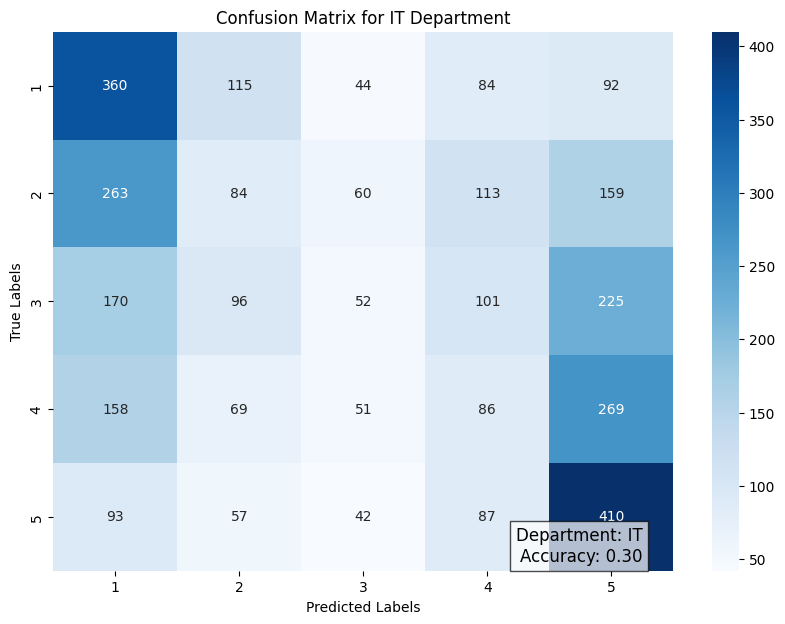


Building logistic regression model for department: Finance



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Finance
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.35      0.49      0.41       666
           2       0.24      0.26      0.25       674
           3       0.06      0.00      0.00       669
           4       0.20      0.18      0.19       673
           5       0.32      0.52      0.40       678

    accuracy                           0.29      3360
   macro avg       0.24      0.29      0.25      3360
weighted avg       0.24      0.29      0.25      3360



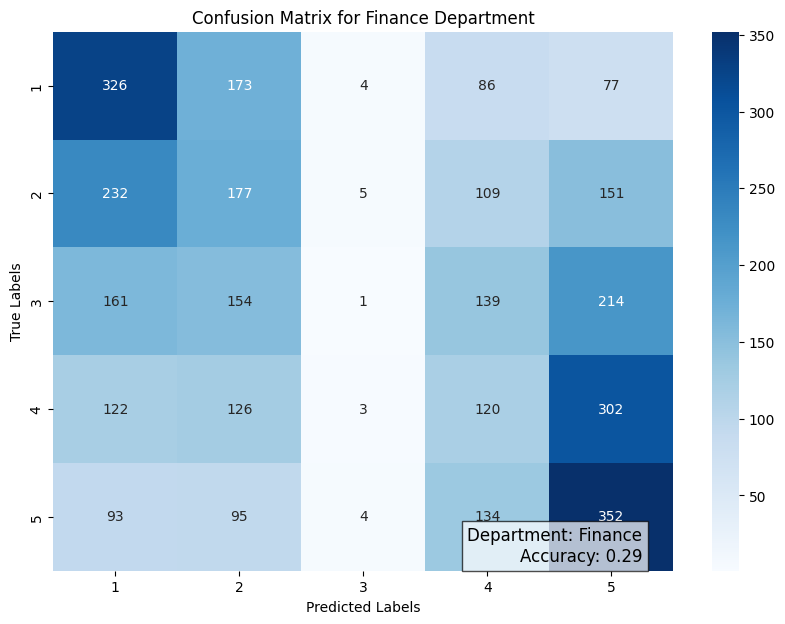


Building logistic regression model for department: Customer Support



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Customer Support
Accuracy: 0.28

Classification Report:
               precision    recall  f1-score   support

           1       0.32      0.55      0.41       652
           2       0.21      0.09      0.12       682
           3       0.18      0.07      0.10       680
           4       0.20      0.15      0.17       663
           5       0.32      0.57      0.41       658

    accuracy                           0.28      3335
   macro avg       0.25      0.29      0.24      3335
weighted avg       0.25      0.28      0.24      3335



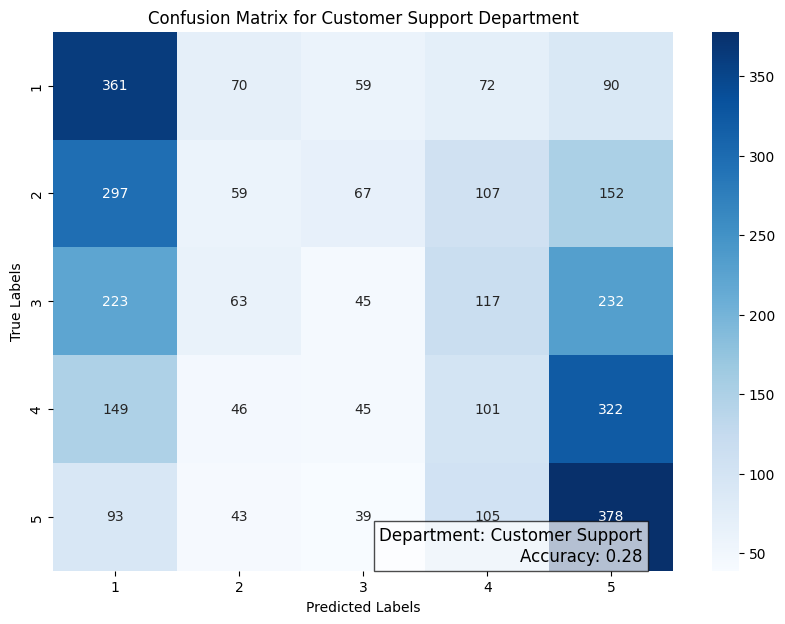


Building logistic regression model for department: Engineering



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Engineering
Accuracy: 0.28

Classification Report:
               precision    recall  f1-score   support

           1       0.32      0.44      0.37       658
           2       0.20      0.13      0.16       644
           3       0.23      0.17      0.20       645
           4       0.16      0.04      0.06       665
           5       0.31      0.61      0.41       675

    accuracy                           0.28      3287
   macro avg       0.24      0.28      0.24      3287
weighted avg       0.24      0.28      0.24      3287



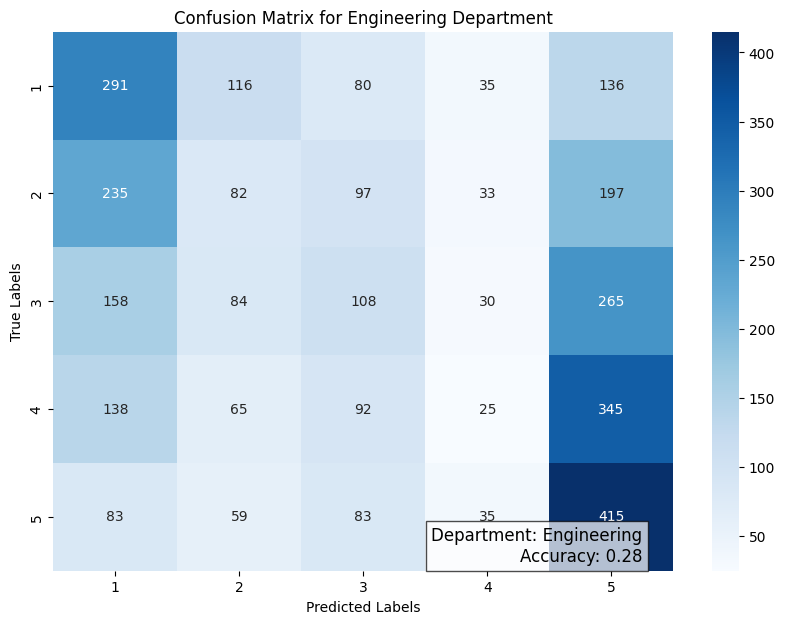


Building logistic regression model for department: Marketing



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Marketing
Accuracy: 0.30

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.53      0.42       683
           2       0.23      0.10      0.14       664
           3       0.22      0.18      0.20       693
           4       0.27      0.14      0.18       661
           5       0.34      0.56      0.42       664

    accuracy                           0.30      3365
   macro avg       0.28      0.30      0.27      3365
weighted avg       0.28      0.30      0.27      3365



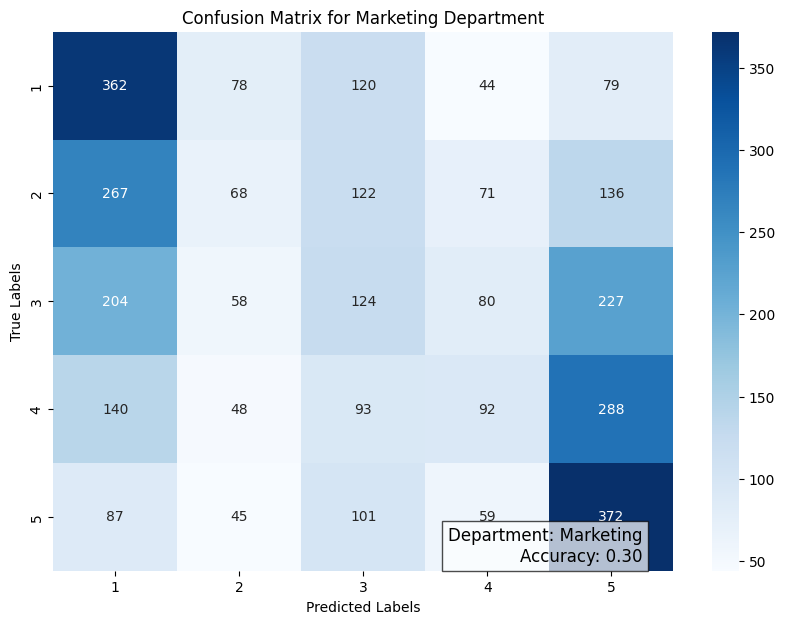


Building logistic regression model for department: Operations



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Operations
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.51      0.41       678
           2       0.18      0.05      0.08       672
           3       0.21      0.17      0.18       665
           4       0.23      0.15      0.18       680
           5       0.33      0.57      0.42       660

    accuracy                           0.29      3355
   macro avg       0.26      0.29      0.25      3355
weighted avg       0.26      0.29      0.25      3355



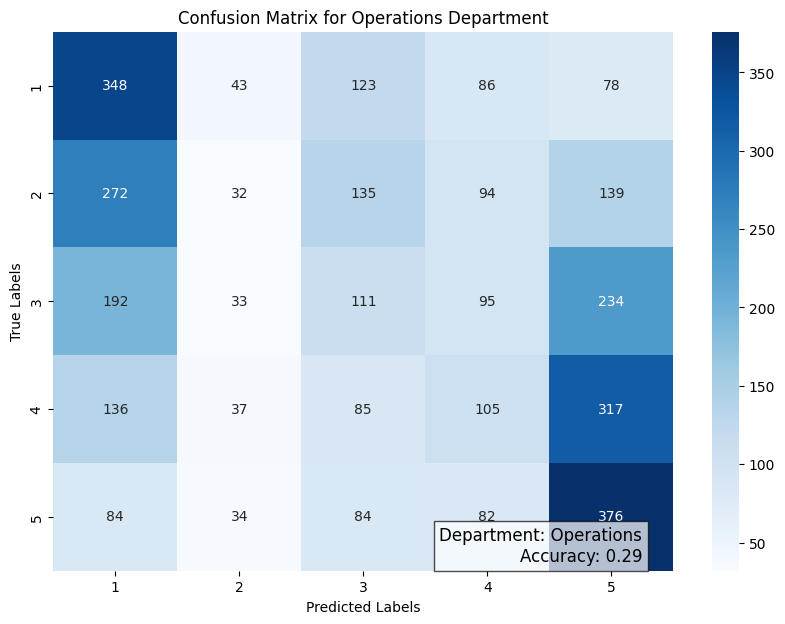


Building logistic regression model for department: Sales



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Sales
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.33      0.52      0.40       681
           2       0.22      0.10      0.14       660
           3       0.23      0.16      0.19       654
           4       0.21      0.08      0.11       718
           5       0.30      0.62      0.41       624

    accuracy                           0.29      3337
   macro avg       0.26      0.29      0.25      3337
weighted avg       0.26      0.29      0.25      3337



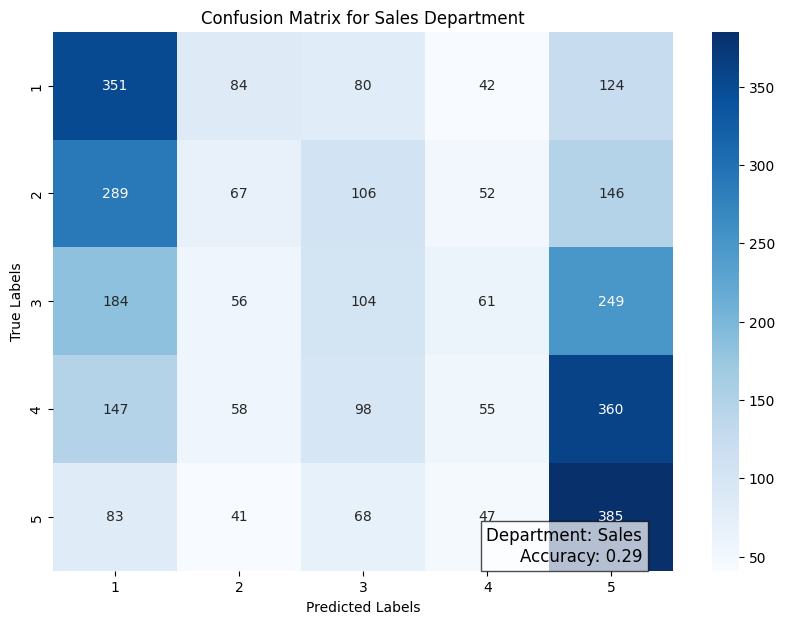


Building logistic regression model for department: Legal



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: Legal
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.33      0.52      0.41       705
           2       0.20      0.08      0.11       653
           3       0.19      0.13      0.15       619
           4       0.20      0.12      0.15       665
           5       0.34      0.57      0.43       694

    accuracy                           0.29      3336
   macro avg       0.25      0.28      0.25      3336
weighted avg       0.25      0.29      0.25      3336



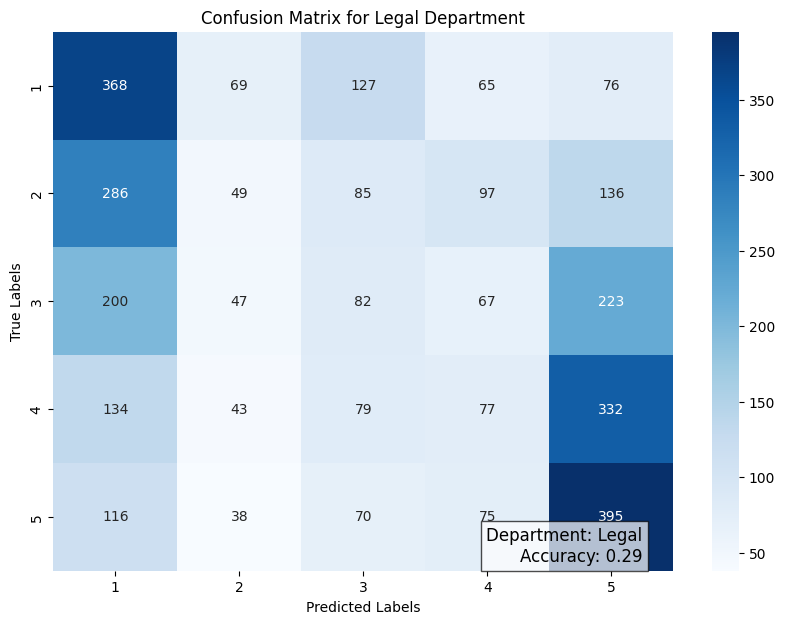


Building logistic regression model for department: HR



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1865023213.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

Department: HR
Accuracy: 0.30

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.51      0.41       647
           2       0.25      0.14      0.18       669
           3       0.21      0.16      0.18       645
           4       0.23      0.09      0.12       657
           5       0.34      0.60      0.43       670

    accuracy                           0.30      3288
   macro avg       0.27      0.30      0.26      3288
weighted avg       0.27      0.30      0.26      3288



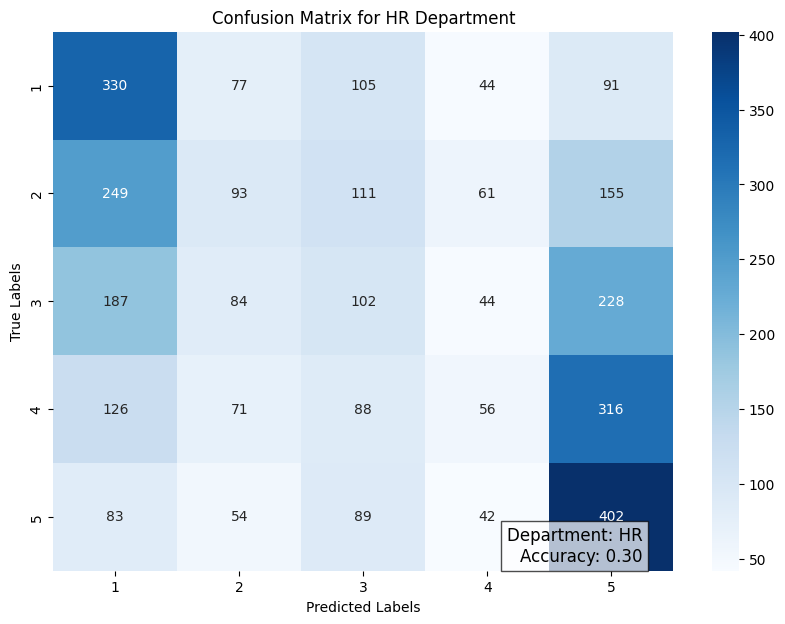

In [18]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding logistic regression model for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Logistic Regression Model
    logistic_model = LogisticRegression(max_iter=1000, random_state=42)
    logistic_model.fit(X_train, y_train)

    # Make predictions
    y_pred = logistic_model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Accuracy: {accuracy:.2f}")
    print("\nClassification Report:\n", report)

    # Visualize the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(
        conf_matrix,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=np.unique(y),
        yticklabels=np.unique(y)
    )
    plt.title(f"Confusion Matrix for {department} Department")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nAccuracy: {accuracy:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )
    plt.show()



Building multiple linear regression model for department: IT

Department: IT
Mean Squared Error: 1.50
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

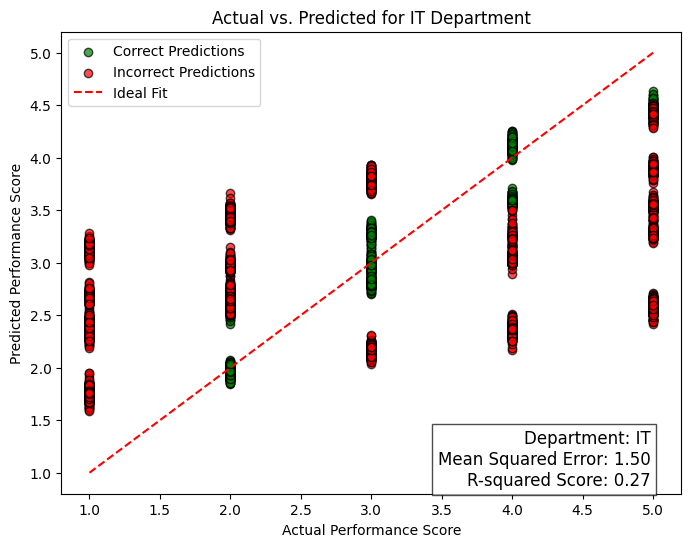


Building multiple linear regression model for department: Finance

Department: Finance
Mean Squared Error: 1.46
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

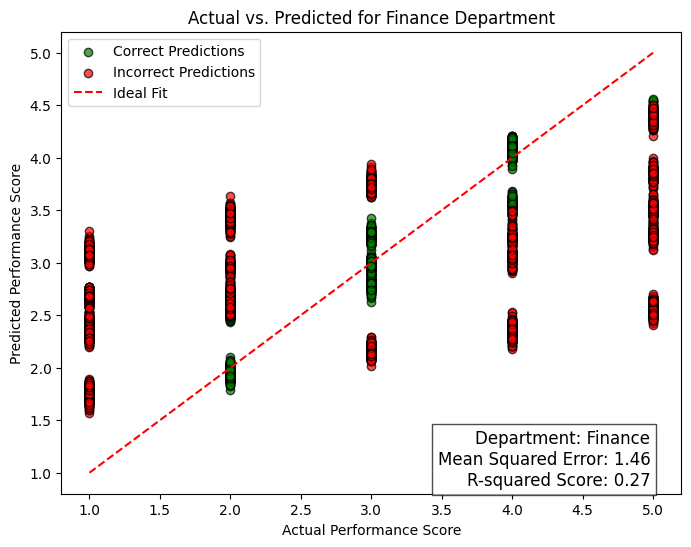


Building multiple linear regression model for department: Customer Support

Department: Customer Support
Mean Squared Error: 1.44
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

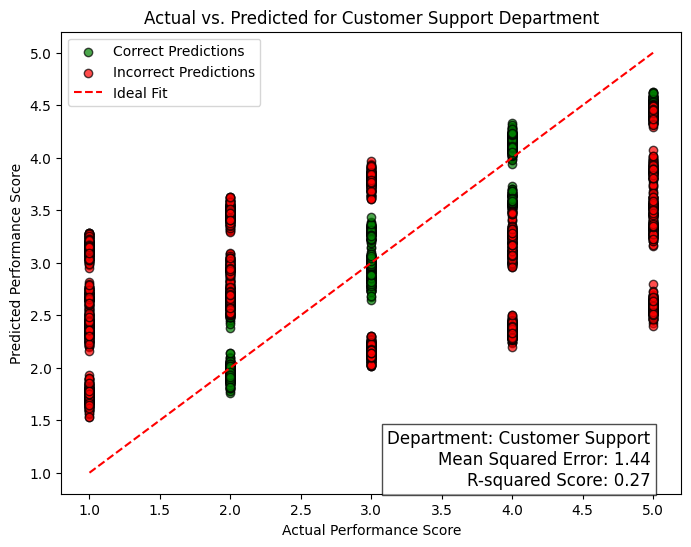


Building multiple linear regression model for department: Engineering

Department: Engineering
Mean Squared Error: 1.52
R-squared Score: 0.25



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

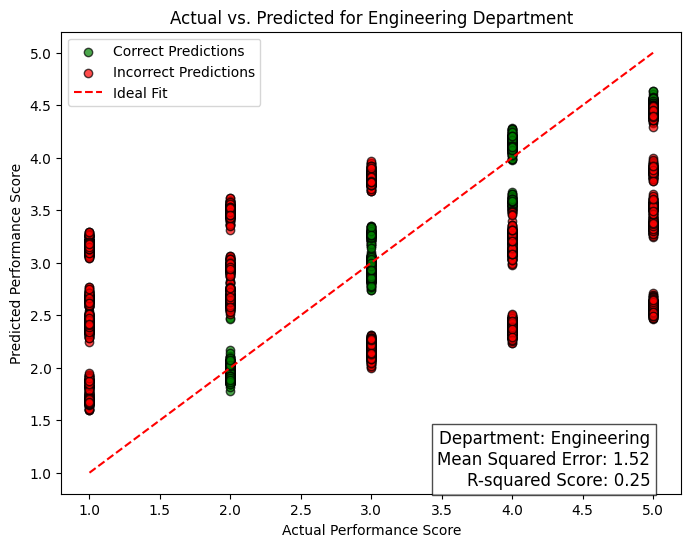


Building multiple linear regression model for department: Marketing

Department: Marketing
Mean Squared Error: 1.45
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

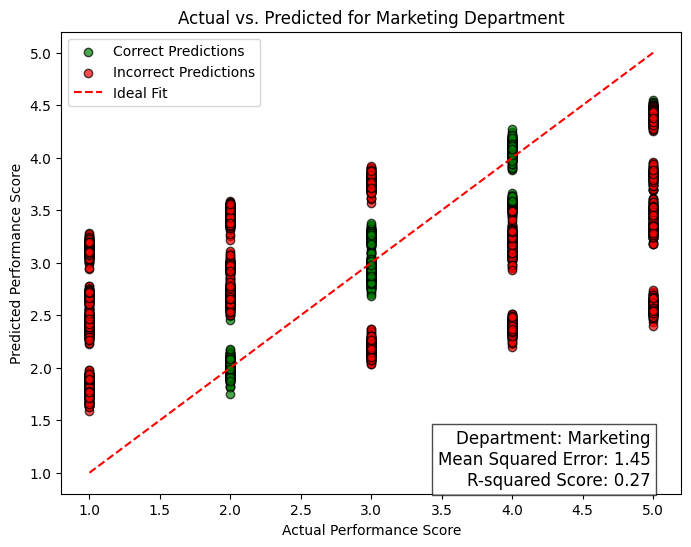


Building multiple linear regression model for department: Operations

Department: Operations
Mean Squared Error: 1.48
R-squared Score: 0.26



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

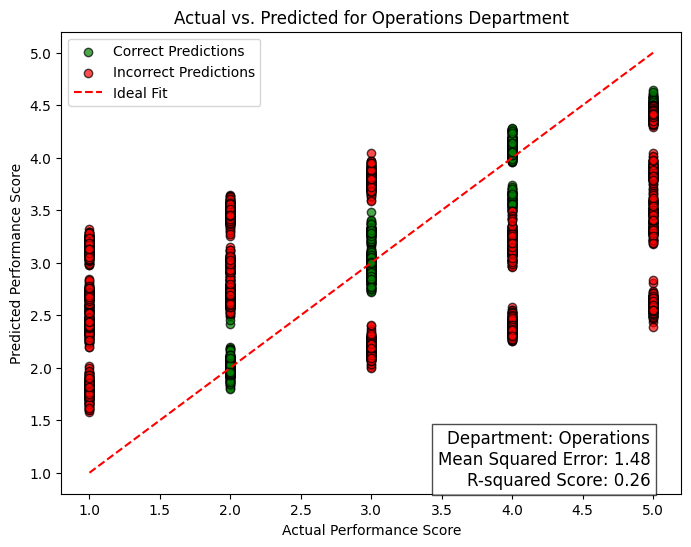


Building multiple linear regression model for department: Sales

Department: Sales
Mean Squared Error: 1.43
R-squared Score: 0.28



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

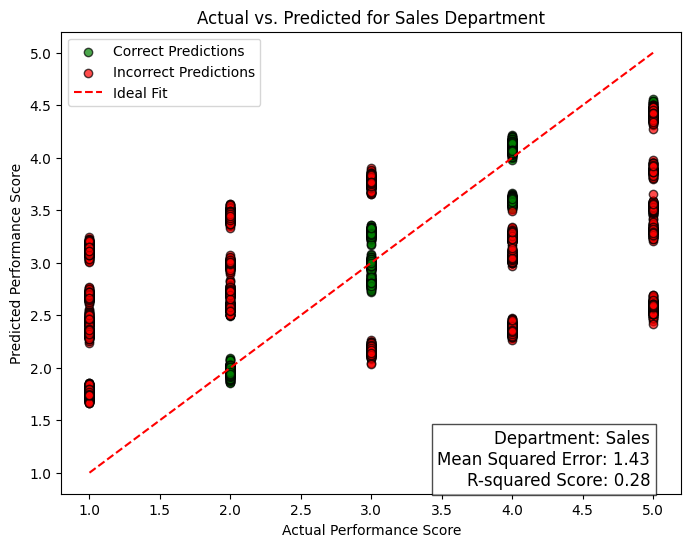


Building multiple linear regression model for department: Legal

Department: Legal
Mean Squared Error: 1.50
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

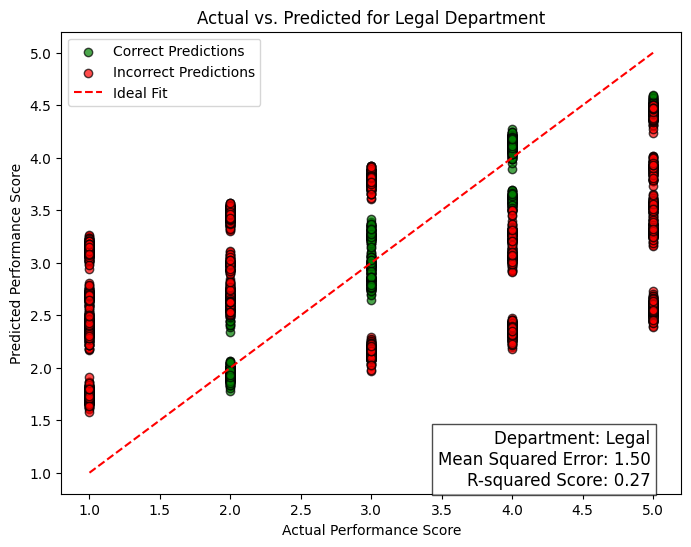


Building multiple linear regression model for department: HR

Department: HR
Mean Squared Error: 1.47
R-squared Score: 0.27



C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].fillna(X[col].mean(), inplace=True)
C:\Users\AMD\AppData\Local\Temp\ipykernel_21352\1049288045.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

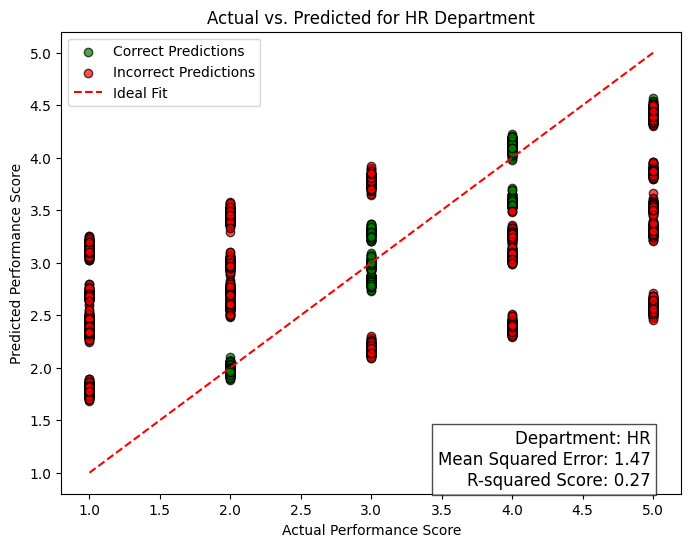

In [21]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Tolerance for considering predictions as "correct"
tolerance = 0.5  # Adjust this value as needed

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding multiple linear regression model for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Multiple Linear Regression Model
    linear_model = LinearRegression()
    linear_model.fit(X_train, y_train)

    # Make predictions
    y_pred = linear_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}\n")

    # Determine correct (green) and incorrect (red) predictions
    correct = np.abs(y_test - y_pred) <= tolerance
    incorrect = ~correct

    # Plot actual vs. predicted values with color-coded points
    plt.figure(figsize=(8, 6))
    plt.scatter(
        y_test[correct], y_pred[correct], c='green', label='Correct Predictions', edgecolors='k', alpha=0.7
    )
    plt.scatter(
        y_test[incorrect], y_pred[incorrect], c='red', label='Incorrect Predictions', edgecolors='k', alpha=0.7
    )
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ideal Fit')  # Reference line

    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nMean Squared Error: {mse:.2f}\nR-squared Score: {r2:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )

    # Graph labels and title
    plt.xlabel('Actual Performance Score')
    plt.ylabel('Predicted Performance Score')
    plt.title(f'Actual vs. Predicted for {department} Department')
    plt.legend()
    plt.show()
